In [2]:
# conda base 

# Data manipulation 
import pandas as pd 
import numpy as np

# Data viz
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import joypy
from matplotlib import cm # for joypy
from matplotlib.colors import LogNorm # for corrs analysis


# analysis
from scipy.stats import spearmanr, pearsonr
from statannotations.Annotator import Annotator

## mbl no filter

In [3]:
# load seqs annots
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

# load tsne coords and merge annots
df_sbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_sbl_esm1b.csv")
df_sbl = df_sbl.merge(df_annot, on = "seq_id")
df_mbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_mbl_esm1b.csv")
df_mbl = df_mbl.merge(df_annot, on = "seq_id")

# rename cols 
df_sbl.rename(columns = {"gravy":"hydropathy"}, inplace = True)
df_mbl.rename(columns = {"gravy":"hydropathy"}, inplace = True)

# list biochem props
properties = ["tSNE1_esm1b", "tSNE2_esm1b", 'length','molecular_weight', 'aromaticity', 'instability', 
              'hydropathy', 'isoelectric_point','entropy','helix', 'turn', 'sheet', "bla_subclass"] 

print(f"data size of MBL = {len(df_mbl)}")
print(f"data size of SBL = {len(df_sbl)}")

data size of MBL = 3134
data size of SBL = 22687


In [4]:
def do_iscatter(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 600, width = 700, color = annot,
    hover_name = "protein_name", 
    color_discrete_sequence = px.colors.qualitative.Plotly,
    hover_data = ["protein_family_header", '#name'])

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()

In [5]:
do_iscatter(df_mbl, "length")

In [6]:
# df_mbl[df_mbl.length > 400][["seq_id","#name","protein_name", "seq"]].to_csv("/home/gama/desktop/mbl_more_than_400aa.csv", index = False)
df_mbl[df_mbl.length > 400]

,tSNE1_esm1b,tSNE2_esm1b,seq_id,#name,seq,length,filename,protein_name,protein_family,bla_class,...,Species,predicted_signal_peptide,Other_sigpept,SP(Sec/SPI),LIPO(Sec/SPII),TAT(Tat/SPI),TATLIPO(Sec/SPII),PILIN(Sec/SPIII),CS Position,seq_without_sigpept
1544,20.268543,10.577355,seq_14854,AIC95013.1|BLEG-1| SpoIVB peptidase,MLKEGVRYVIGVLFLVCLLFLGFNPQFKQFIDIPTSIVLFEGSETA...,428,B3-BLEG-1-prot.fasta,BLEG-1,BLEG,Class B,...,NaN,NO_SP,0.999979,0.000019,0.000000,0.000000,0.000000,0.000000,NaN,MLKEGVRYVIGVLFLVCLLFLGFNPQFKQFIDIPTSIVLFEGSETA...
1585,-6.316272,3.769696,seq_14895,ETI88495.1|CLO3B1-1| hypothetical protein Q607...,MLNKVTKILLSAVVVSMSISALAVFSLRASAETKDSSIAETAADNN...,422,B3-CLO3B1-1-prot.fasta,CLO3B1-1,CLO3B1,Class B,...,s__Clostridium saccharobutylicum,SP,0.047028,0.952043,0.000252,0.000266,0.000201,0.000185,CS pos: 31-32. Pr: 0.9515,ETKDSSIAETAADNNDDQKKQSGGPPALIMNTTPIEPTKVFDNLYF...
1586,-6.315556,3.773975,seq_14896,WP_052661668.1|CLO3B1-2| Clostridium butyricum...,MLNKVTKILLSAVVVSMSISALAVFSLRASAETKDSSIAETAADNN...,422,B3-CLO3B1-2-prot.fasta,CLO3B1-2,CLO3B1,Class B,...,s__Clostridium saccharobutylicum,SP,0.047028,0.952043,0.000252,0.000266,0.000201,0.000185,CS pos: 31-32. Pr: 0.9515,ETKDSSIAETAADNNDDQKKQSGGPPALIMNTTPIEPTKVFDNLYF...
1677,-11.394574,-3.895904,seq_14987,WP_019578269.1|CUR3B1-1| Curvibacter lanceolat...,MQNKTHTRGDNMARTALITSIALAVLTACSTIAPQQATVDQHVHEA...,403,B3-CUR3B1-1-prot.fasta,CUR3B1-1,CUR3B1,Class B,...,NaN,LIPO,0.000759,0.001626,0.997531,0.000060,0.000011,0.000001,CS pos: 28-29. Pr: 0.9965,CSTIAPQQATVDQHVHEAQSLAGDDLKFLLPVCNPQPAVRAAPSPA...
1678,-11.414822,-3.897536,seq_14988,WP_027477736.1|CUR3B1-2| Curvibacter gracilis ...,MQNKTHTRGDNMARTALITSIALAVLTACSTIAPQQATVDQHVHEA...,403,B3-CUR3B1-2-prot.fasta,CUR3B1-2,CUR3B1,Class B,...,NaN,LIPO,0.000759,0.001626,0.997531,0.000060,0.000011,0.000001,CS pos: 28-29. Pr: 0.9965,CSTIAPQQATVDQHVHEAQSLAGDDLKFLLPVCNPQPAVRAAPSPA...
1789,-3.679024,-5.530919,seq_15099,OUV83674.1|GPB3B2-1| hypothetical protein CBC9...,MRTTVLLLLVAAAWQAAIANPARSWQAISPAGETRCSDGSEYRFLV...,635,B3-GPB3B2-1-prot.fasta,GPB3B2-1,GPB3B2,Class B,...,s__UBA4421 sp002470275,SP,0.000185,0.999209,0.000157,0.000162,0.000134,0.000131,CS pos: 19-20. Pr: 0.9775,NPARSWQAISPAGETRCSDGSEYRFLVRKGKPEHLVLYFQGGGACW...
1790,-3.693752,-5.552357,seq_15100,OUV13360.1|GPB3B3-1| hypothetical protein CBC5...,MGRGSMRKISISSGFWLGLLLHLGGCTAEQTIPESTTAAAAATFDW...,654,B3-GPB3B3-1-prot.fasta,GPB3B3-1,GPB3B3,Class B,...,s__UBA4421 sp002170355,LIPO,0.000034,0.169893,0.830018,0.000018,0.000016,0.000016,CS pos: 25-26. Pr: 0.7993,CTAEQTIPESTTAAAAATFDWXEIYPGGAAICSDGSPYKFLTRKGS...
1791,-3.688181,-5.529556,seq_15101,OUX13000.1|GPB3B4-1| hypothetical protein CBE0...,MQYPTFRRRFATLLAIFVFSACQPESTTPASDAPQSTGTPTEASAT...,660,B3-GPB3B4-1-prot.fasta,GPB3B4-1,GPB3B4,Class B,...,s__UBA4421 sp002704225,LIPO,0.000001,0.000087,0.999904,0.000000,0.000000,0.000000,CS pos: 21-22. Pr: 0.9964,CQPESTTPASDAPQSTGTPTEASATPTDWQKISPAANTTCSDGSPY...
2524,-13.691948,1.755227,seq_15834,OAI53369.1|XB3X1083-1| hypothetical protein AY...,MFLTPLTLALAAIGQGPADWYEPFPAHKVVGNVYYVGSKDLATYLI...,655,B3-XB3X1083-1-prot.fasta,XB3X1083-1,XB3X1083,Class B,...,s__GCA-2726245 sp014381825,SP,0.000285,0.998933,0.000245,0.000210,0.000174,0.000167,CS pos: 18-19. Pr: 0.5653,DWYEPFPAHKVVGNVYYVGSKDLATYLITTPEGHILINSGFERTVP...
2562,-11.670873,-2.104919,seq_15872,WP_084759822.1|XB3X1124-1| subclass B3 metallo...,MRPPGPASDMNVIARSNAGKPGDDAVRSWLAPIILPTRNRSMIRIS...,674,B3-XB3X1124-1-prot.fasta,XB3X1124-1,XB3X1124,Class B,...,s__Zavarzinella formosa,SP,0.497155,0.499423,0.003193,0.000096,0.000069,0.000061,CS pos: 63-64. Pr: 0.4926,AEPTSIPRATTPQVHQAVDHAIKYLQTECAAWLNTRQCAACHHVPM...


In [7]:
# remove nans to cpute corrs 
# SBL has 37 data points with nans 
df_sbl = df_sbl[properties].dropna(how='any')
df_sbl

,tSNE1_esm1b,tSNE2_esm1b,length,molecular_weight,aromaticity,instability,hydropathy,isoelectric_point,entropy,helix,turn,sheet,bla_subclass
0,-35.615970,-22.212238,256,26980.5917,0.042969,22.613281,0.058594,7.759625,3.737274,0.265625,0.171875,0.375000,Consensus
1,37.950127,4.985038,357,38254.6900,0.089636,27.374230,0.002521,8.439766,3.976315,0.310924,0.246499,0.316527,Consensus
2,1.345453,51.588600,232,26871.6074,0.142241,38.615517,-0.374138,8.827350,4.056356,0.366379,0.198276,0.237069,Consensus
3,-0.283795,-13.681005,284,32041.5642,0.080986,33.895775,-0.316901,8.350993,4.124073,0.295775,0.204225,0.246479,Class A
4,-0.266154,-13.693493,284,32045.5974,0.084507,33.596831,-0.302465,8.549555,4.127280,0.299296,0.207746,0.239437,Class A
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22682,-0.270373,-30.434637,263,28568.3526,0.045627,41.917871,-0.074144,5.125138,4.015439,0.281369,0.193916,0.349810,Ancestral
22683,-39.102330,-18.253770,262,27972.3221,0.045802,33.157252,-0.135878,4.974401,3.885921,0.274809,0.187023,0.339695,Ancestral
22684,-38.903748,-18.289371,269,28836.5092,0.040892,39.871004,-0.076580,5.647829,3.942361,0.278810,0.193309,0.353160,Ancestral
22685,-39.032295,-18.264486,262,28055.4123,0.053435,32.650763,-0.170992,5.166858,3.900318,0.270992,0.190840,0.354962,Ancestral


In [8]:
# MBL has 10 data points with nans 
df_mbl = df_mbl[properties].dropna(how='any')
df_mbl

,tSNE1_esm1b,tSNE2_esm1b,length,molecular_weight,aromaticity,instability,hydropathy,isoelectric_point,entropy,helix,turn,sheet,bla_subclass
0,22.181564,2.912603,227,24953.5601,0.066079,20.035286,-0.210132,5.994774,3.919929,0.339207,0.211454,0.281938,Consensus
1,9.353285,2.012980,245,26983.5704,0.102041,13.804531,-0.113061,5.649762,4.046732,0.338776,0.204082,0.285714,Consensus
2,-13.557014,-1.469794,242,25670.9469,0.086777,30.484298,0.035124,5.961580,3.969864,0.305785,0.243802,0.309917,Consensus
3,7.193426,2.912521,162,17603.3070,0.092593,15.782716,0.069753,9.666406,3.860085,0.351852,0.209877,0.265432,Consensus
4,14.662153,7.669428,274,29843.8079,0.076642,21.874818,-0.114234,6.300909,4.058963,0.306569,0.226277,0.251825,Class B1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3129,-9.951183,0.971327,290,32015.3655,0.096552,36.082414,-0.182069,8.655606,4.110630,0.310345,0.231034,0.244828,Class B3
3130,-9.800899,0.838023,282,31448.5988,0.102837,32.068794,-0.177660,6.162165,4.157670,0.308511,0.202128,0.276596,Class B3
3131,-9.860554,1.162265,288,31932.5661,0.104167,31.056944,-0.070833,8.877313,4.112526,0.326389,0.222222,0.260417,Class B3
3132,-9.786364,0.948950,292,32356.0830,0.099315,26.771233,-0.113699,8.512099,4.104396,0.315068,0.198630,0.280822,Class B3


In [9]:
properties2 = ['length','molecular_weight', 'aromaticity', 'instability', 
              'hydropathy', 'isoelectric_point','entropy','helix', 'turn', 'sheet'] 

def do_scatter_panel(df, title):


    # set figure composition
    plt.figure(figsize=(16,9)) # 25,10
    
    # iterate over each panel
    for idx, prop in enumerate(properties2):
           
        # set palette
        palette = "Spectral_r"
        
        # create continuous colorbar normalized
        norm = plt.Normalize(df[prop].min(), df[prop].max())
        sm = plt.cm.ScalarMappable(cmap = palette, norm = norm)
        sm.set_array([])

        # data = 
        data = df[prop].values

        # compute corrs
        spearman_x = spearmanr(df.tSNE1_esm1b.values, data)[0]
        spearman_y = spearmanr(df.tSNE2_esm1b.values, data)[0]

        # plot
        ax = plt.subplot(3, 4, idx+1)
        sns.scatterplot(
            data = df.sort_values(prop, ascending=False), x = "tSNE1_esm1b", y = "tSNE2_esm1b", alpha = 1, s = 1,
            style = "bla_subclass", hue = prop, palette = palette, edgecolor = "black", ax = ax)
        plt.title(prop)
        plt.xlabel(f"Spearman = {spearman_x:.2f}")
        plt.ylabel(f"Spearman = {spearman_y:.2f}")

        # remove dafault legend and add colorbar
        ax.get_legend().remove()
        ax.figure.colorbar(sm)
        plt.tight_layout()
        
    plt.suptitle(title)
    plt.tight_layout()

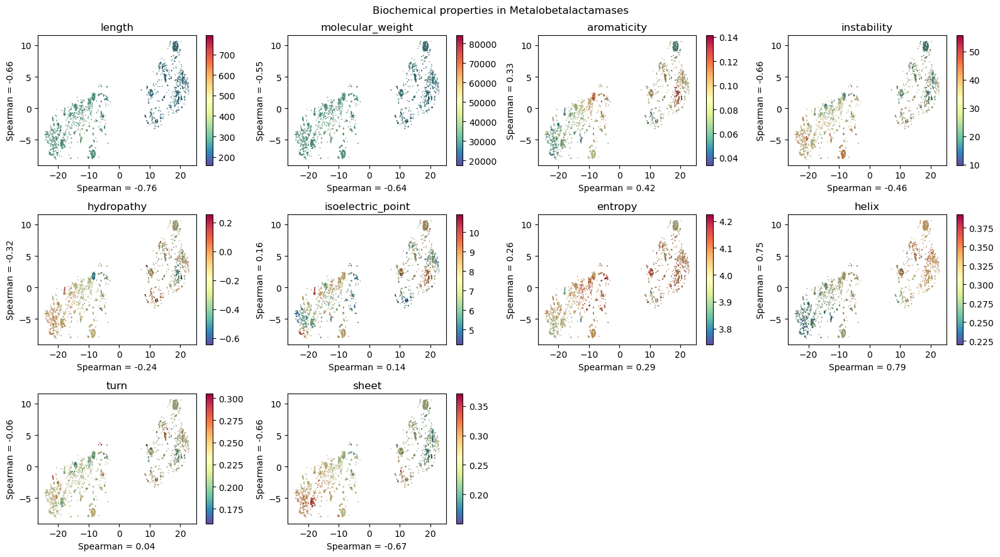

In [10]:
do_scatter_panel(df_mbl, "Biochemical properties in Metalobetalactamases")

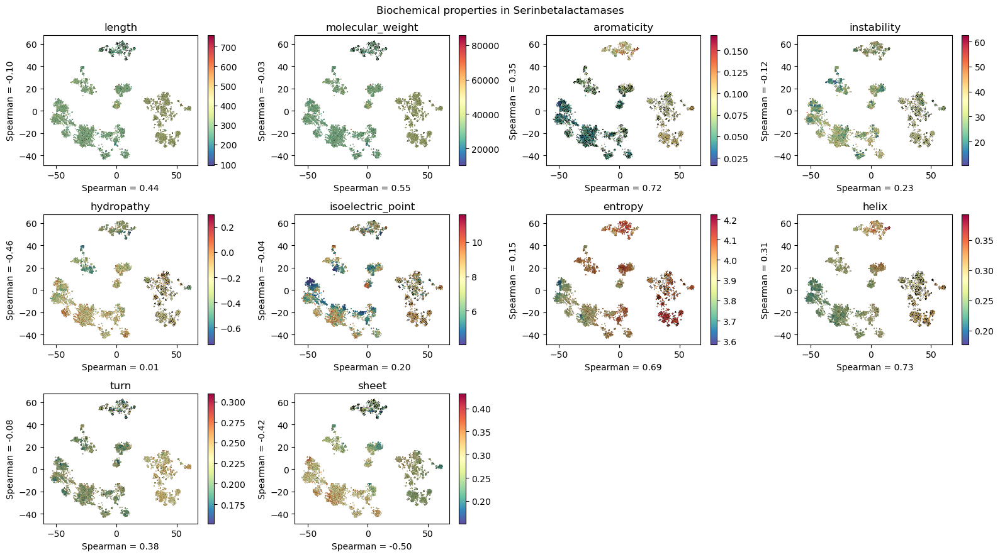

In [11]:
do_scatter_panel(df_sbl, "Biochemical properties in Serinbetalactamases")

## mbl wo outliers

In [12]:
def do_iscatter(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 600, width = 700, color = annot,
    hover_name = "protein_name", 
    color_discrete_sequence = px.colors.qualitative.Plotly,
    hover_data = ["length","protein_family_header", '#name', "protein_name",
                  'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species'])

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()

In [13]:
# set proprs
properties = ["tSNE1_esm1b", "tSNE2_esm1b", 'length','molecular_weight', 'aromaticity', 'instability', 
              'hydropathy', 'isoelectric_point','entropy','helix', 'turn', 'sheet', 
              "bla_subclass", "protein_name", "protein_family_header", "#name",
             'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species'] 

# load seqs annots
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

# load tsne coords and merge annots
df_sbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_sbl_esm1b.csv")
df_sbl = df_sbl.merge(df_annot, on = "seq_id")
df_mbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_mbl_esm1b.csv")
df_mbl = df_mbl.merge(df_annot, on = "seq_id")

# rename cols 
df_sbl.rename(columns = {"gravy":"hydropathy"}, inplace = True)
df_mbl.rename(columns = {"gravy":"hydropathy"}, inplace = True)

In [14]:
# filter data based on median len as in notebook 1 
df_b1 = df_mbl[df_mbl.bla_subclass.str.contains("Class B1")]
df_b2 = df_mbl[df_mbl.bla_subclass.str.contains("Class B2")]
df_b3 = df_mbl[df_mbl.bla_subclass.str.contains("Class B3")]
df_b_sign = df_mbl[df_mbl.bla_subclass.str.contains("Consensus")]

b1 = df_b1[(df_b1.length >= 175)   & (df_b1.length <= 325)]
b2 = df_b2[(df_b2.length >= 177.8) & (df_b2.length <= 330.2)]
b3 = df_b3[(df_b3.length >= 205.1) & (df_b3.length <= 380.9)]

#concat
df_mbl_filtered = pd.concat([b1, b2, b3, df_b_sign], axis = 0).reset_index(drop=True)

# MBL has 10 data points with nans using entropy as col
df_mbl_filtered = df_mbl_filtered[properties].dropna(subset=['entropy'])
df_mbl_filtered

,tSNE1_esm1b,tSNE2_esm1b,length,molecular_weight,aromaticity,instability,hydropathy,isoelectric_point,entropy,helix,...,bla_subclass,protein_name,protein_family_header,#name,Phylum,Class,Order,Family,Genus,Species
0,14.662153,7.669428,274,29843.8079,0.076642,21.874818,-0.114234,6.300909,4.058963,0.306569,...,Class B1,ACI1B1-1,Other,SDB96937.1|ACI1B1-1| metallo-beta-lactamase cl...,p__Proteobacteria,c__Gammaproteobacteria,o__Pseudomonadales,f__Moraxellaceae,g__Acinetobacter,s__Acinetobacter marinus
1,13.510528,-1.612957,244,26588.8583,0.077869,28.800451,-0.082787,5.504538,4.129583,0.303279,...,Class B1,AES1B1-1,Other,SHG71647.1|AES1B1-1| Aestuariibacter aggregatus,p__Proteobacteria,c__Gammaproteobacteria,o__Enterobacterales,f__Alteromonadaceae,g__Alteromonas,s__Alteromonas aggregata
2,9.495288,-2.323225,267,28224.7045,0.063670,30.210150,-0.065169,6.036892,4.069434,0.258427,...,Class B1,AFM-1,AFM,AYV97588.1|AFM-1| subclass B1 metallo-beta-lac...,p__Proteobacteria,c__Gammaproteobacteria,o__Burkholderiales,f__Burkholderiaceae,g__Comamonas,s__Comamonas testosteroni_D
3,9.537949,-2.295163,267,28252.7576,0.063670,30.210150,-0.056180,6.036892,4.074569,0.262172,...,Class B1,AFM-2,AFM,QHT72950.1|AFM-2| subclass B1 metallo-beta-lac...,p__Proteobacteria,c__Gammaproteobacteria,o__Burkholderiales,f__Burkholderiaceae,g__Comamonas,s__Comamonas testosteroni_D
4,9.559313,-2.280316,267,28214.6666,0.063670,29.488801,-0.062172,6.036892,4.069434,0.258427,...,Class B1,AFM-3,AFM,QTH36338.1|AFM-3| subclass B1 metallo-beta-lac...,p__Proteobacteria,c__Gammaproteobacteria,o__Burkholderiales,f__Burkholderiaceae,g__Comamonas,s__Comamonas testosteroni_D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3107,-9.463739,0.859882,294,32574.8940,0.105442,32.948299,-0.258503,8.238044,4.147269,0.295918,...,Class B3,XB3X999-1,Other,SDZ88446.1|XB3X999-1| subclass B3 metallo-beta...,p__Bacteroidota,c__Bacteroidia,o__Sphingobacteriales,f__Sphingobacteriaceae,g__Pedobacter,s__Pedobacter hartonius
3108,22.181564,2.912603,227,24953.5601,0.066079,20.035286,-0.210132,5.994774,3.919929,0.339207,...,Consensus,cons_msa_all_class_b1_filtSeqByLen_clust90_gap...,Consensus,cons_msa_all_class_b1_filtSeqByLen_clust90_gap...,p__Bacteroidota,c__Bacteroidia,NaN,NaN,NaN,NaN
3109,9.353285,2.012980,245,26983.5704,0.102041,13.804531,-0.113061,5.649762,4.046732,0.338776,...,Consensus,cons_msa_all_class_b2_filtSeqByLen_clust90_gap...,Consensus,cons_msa_all_class_b2_filtSeqByLen_clust90_gap...,p__Proteobacteria,c__Gammaproteobacteria,NaN,NaN,NaN,NaN
3110,-13.557014,-1.469794,242,25670.9469,0.086777,30.484298,0.035124,5.961580,3.969864,0.305785,...,Consensus,cons_msa_all_class_b3_filtSeqByLen_clust90_gap...,Consensus,cons_msa_all_class_b3_filtSeqByLen_clust90_gap...,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
df_mbl_filtered.groupby(['bla_subclass'])['length'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
bla_subclass,,,,,,,,
Class B1,1205.0,252.54,12.20,185.0,246.00,250.0,258.00,304.0
Class B2,201.0,247.17,17.99,186.0,253.00,254.0,254.00,279.0
Class B3,1693.0,297.48,19.24,211.0,288.00,293.0,304.00,374.0
Consensus,4.0,219.00,38.81,162.0,210.75,234.5,242.75,245.0


In [16]:
df_mbl_filtered.groupby(['bla_subclass'])['helix'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
bla_subclass,,,,,,,,
Class B1,1205.0,0.33,0.02,0.25,0.32,0.33,0.34,0.39
Class B2,201.0,0.33,0.01,0.30,0.33,0.33,0.34,0.35
Class B3,1693.0,0.29,0.03,0.22,0.26,0.28,0.31,0.37
Consensus,4.0,0.33,0.02,0.31,0.33,0.34,0.34,0.35


In [17]:
df_mbl_filtered.groupby(['bla_subclass'])['sheet'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
bla_subclass,,,,,,,,
Class B1,1205.0,0.24,0.04,0.15,0.21,0.24,0.26,0.37
Class B2,201.0,0.25,0.02,0.22,0.24,0.25,0.26,0.30
Class B3,1693.0,0.28,0.04,0.17,0.25,0.27,0.30,0.37
Consensus,4.0,0.29,0.02,0.27,0.28,0.28,0.29,0.31


In [18]:
df_mbl_filtered.groupby(['bla_subclass'])['instability'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
bla_subclass,,,,,,,,
Class B1,1205.0,27.24,7.21,9.76,21.27,26.23,32.68,51.91
Class B2,201.0,24.74,4.46,15.88,21.68,24.62,26.92,41.77
Class B3,1693.0,33.96,7.86,13.60,29.12,33.07,40.06,55.70
Consensus,4.0,20.03,7.44,13.80,15.29,17.91,22.65,30.48


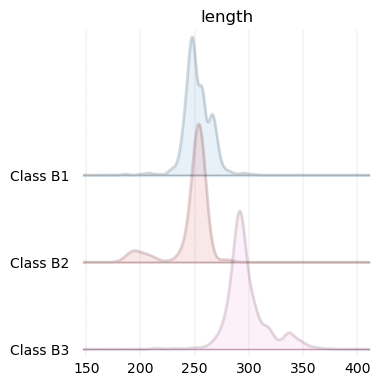

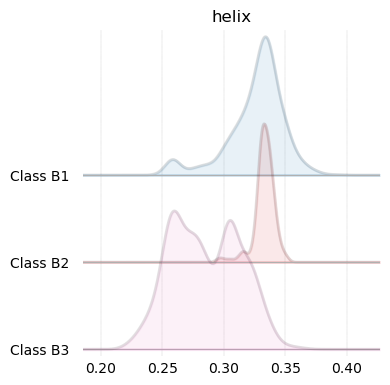

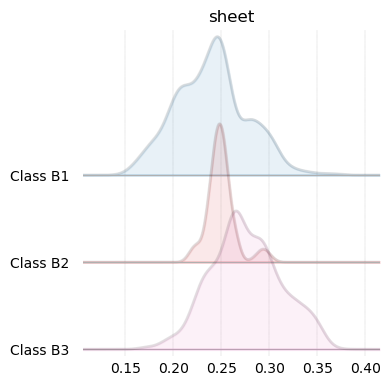

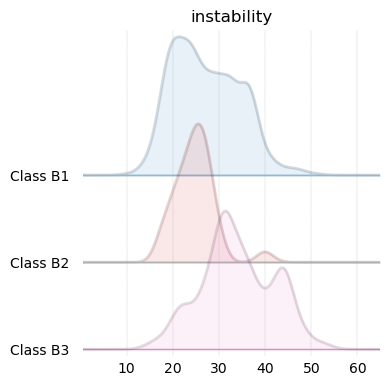

In [19]:
df_mbl_nocons = df_mbl_filtered[~df_mbl_filtered.bla_subclass.str.contains("Consensus")]

# seq_length by bla_class


for ele in ["length", "helix","sheet", "instability"]:
    fig, axes = joypy.joyplot(
        df_mbl_nocons[[ele, "bla_subclass"]], by="bla_subclass", ylim='own', 
        overlap=1, range_style='all', grid=True, linewidth=2, legend=False, figsize=(4,4),
        alpha=0.1, linecolor="black", background='white',fill=True,
        kind="kde", title = ele,colormap = cm.tab10) 
    plt.grid(color = 'grey', linestyle = '--', linewidth = 0.15)


############### length ###############

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Class B1 vs. Class B2: Kruskal-Wallis independent samples (pairwise between groups), P_val:5.529e-01 Stat=3.522e-01
Class B2 vs. Class B3: Kruskal-Wallis independent samples (pairwise between groups), P_val:3.837e-114 Stat=5.156e+02
Class B1 vs. Class B3: Kruskal-Wallis independent samples (pairwise between groups), P_val:0.000e+00 Stat=1.961e+03

############### helix ###############

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Class B1 vs. Class B2: Kruskal-Wallis independent samples (pairwise between groups), P_val:1.130e-03 Stat=1.060e+01
Class B2 vs. Class B3: Kruskal-Wallis independent samples (pairwise between groups), P_val:1

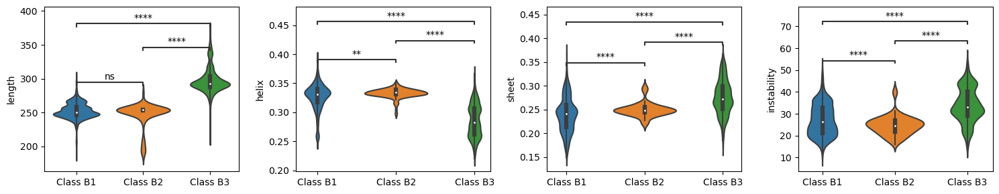

In [20]:
fig, axs = plt.subplots(ncols=4, figsize=(15, 3))

for i, ele in enumerate(["length", "helix", "sheet", "instability"]):
    
    print(f"\n############### {ele} ###############\n")
    x = "bla_subclass"
    y = ele
    order = ['Class B1', 'Class B2', 'Class B3']
    
    ax = axs[i]
    sns.violinplot(data=df_mbl_nocons, x=x, y=y, order=order, ax=ax)
    
    annot = Annotator(ax, [
        ("Class B1", "Class B2"), 
        ("Class B1", "Class B3"),
        ("Class B2", "Class B3")], 
        data=df_mbl_nocons, x=x, y=y, order=order)
    
    annot.configure(test='Kruskal', text_format='star', loc='inside', verbose=2)
    annot.apply_test()
    ax, test_results = annot.annotate()
    
    ax.set_xlabel("")
    
fig.tight_layout()

In [21]:
do_iscatter(df_mbl[df_mbl.instability > 40], "instability")

total number of removed seqs = 31


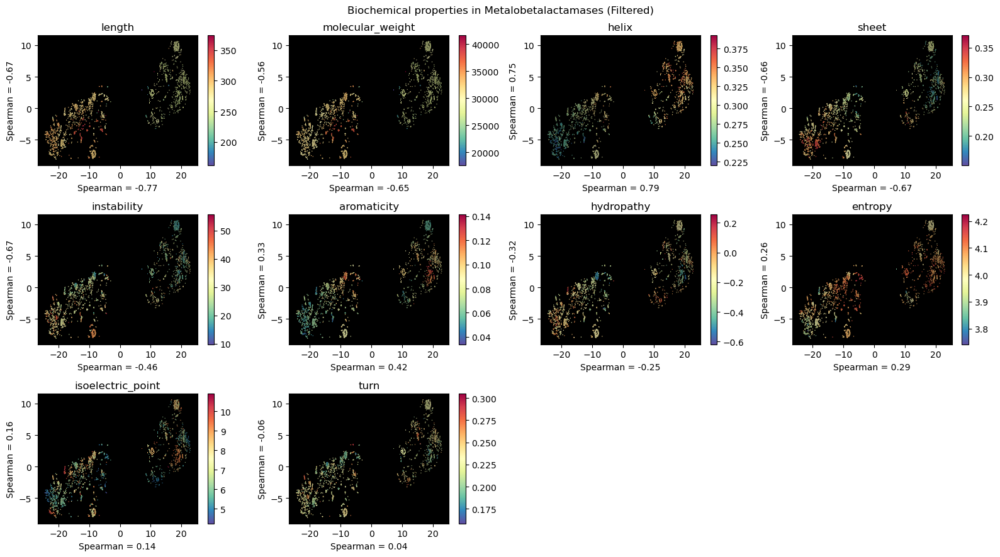

In [22]:
properties2 = ['length','molecular_weight', 'helix', 'sheet', 'instability', 'aromaticity', 
 'hydropathy', 'entropy','isoelectric_point', 'turn'] 


def do_scatter_panel(df, title):


    # set figure composition
    plt.figure(figsize=(16,9)) # 25,10
    
    # iterate over each panel
    for idx, prop in enumerate(properties2):
           
        # set palette
        palette = "Spectral_r"
        
        # create continuous colorbar normalized
        norm = plt.Normalize(df[prop].min(), df[prop].max())
        sm = plt.cm.ScalarMappable(cmap = palette, norm = norm)
        sm.set_array([])

        # data = 
        data = df[prop].values

        # compute corrs
        spearman_x = spearmanr(df.tSNE1_esm1b.values, data)[0]
        spearman_y = spearmanr(df.tSNE2_esm1b.values, data)[0]

        # plot
        ax = plt.subplot(3, 4, idx+1)
        ax.set_facecolor('black')
        sns.scatterplot(
            data = df.sort_values(prop, ascending=False), x = "tSNE1_esm1b", y = "tSNE2_esm1b", alpha = 1, s = 1,
            style = "bla_subclass", hue = prop, palette = palette, edgecolor = "black", ax = ax)
        plt.title(prop)
        plt.xlabel(f"Spearman = {spearman_x:.2f}")
        plt.ylabel(f"Spearman = {spearman_y:.2f}")

        # remove dafault legend and add colorbar
        ax.get_legend().remove()
        ax.figure.colorbar(sm)
        plt.tight_layout()
        
    plt.suptitle(title)
    plt.tight_layout()
    
print(f"total number of removed seqs = {len(df_mbl) - len(df_mbl_filtered)}")

do_scatter_panel(df_mbl_filtered, "Biochemical properties in Metalobetalactamases (Filtered)")

total number of removed seqs = 31


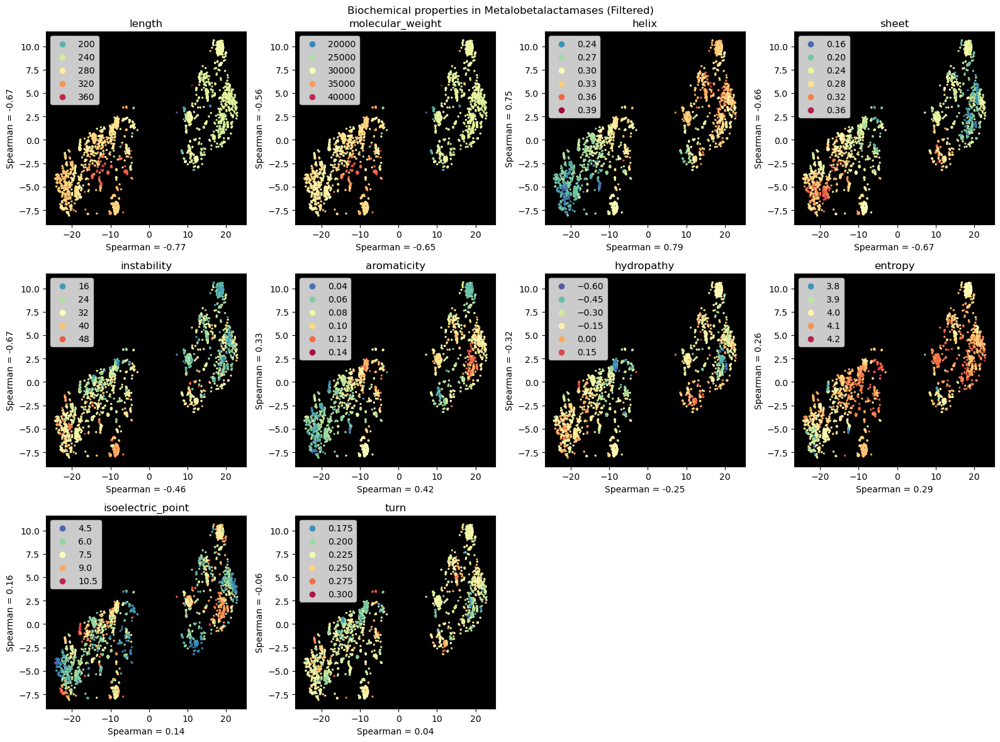

In [23]:
properties2 = ['length','molecular_weight', 'helix', 'sheet', 'instability', 'aromaticity', 
 'hydropathy', 'entropy','isoelectric_point', 'turn'] 


def do_scatter_panel(df, title):


    # set figure composition
    plt.figure(figsize=(16,12)) # 25,10
    
    # iterate over each panel
    for idx, prop in enumerate(properties2):
           
        # set palette
        palette = "Spectral_r"
        


        # data = 
        data = df[prop].values

        # compute corrs
        spearman_x = spearmanr(df.tSNE1_esm1b.values, data)[0]
        spearman_y = spearmanr(df.tSNE2_esm1b.values, data)[0]

        # plot
        ax = plt.subplot(3, 4, idx+1)
        ax.set_facecolor('black')
        sns.scatterplot(
            data = df.sort_values(prop, ascending=False), x = "tSNE1_esm1b", y = "tSNE2_esm1b", alpha = 1, s = 5,
             hue = prop, palette = palette, edgecolor = None, ax = ax)
        plt.title(prop)
        plt.xlabel(f"Spearman = {spearman_x:.2f}")
        plt.ylabel(f"Spearman = {spearman_y:.2f}")
        plt.legend(frameon=True)

 
        
    plt.suptitle(title)
    plt.tight_layout()
    
print(f"total number of removed seqs = {len(df_mbl) - len(df_mbl_filtered)}")

do_scatter_panel(df_mbl_filtered, "Biochemical properties in Metalobetalactamases (Filtered)")

In [24]:
def do_corr_mat(method, df, title):
    
    """
    Compute a corr matrix given a method (pearson/spearman), df and title
    """
    
    # compute corr, mask and palette
    corr_r = df.corr(method = method)
    mask_r = np.triu(np.ones_like(corr_r, dtype=bool)) 
    custom_cmap = sns.diverging_palette(15, 250, as_cmap=True) # custom diverging cmap
    
    # plot
    plt.figure(figsize=(8,8))
    sns.heatmap(
        corr_r, mask = mask_r, cmap = custom_cmap, vmax = 1, vmin = -1, annot=True, fmt = ".2f",
        square=True, linewidths=0, center = 0,
        annot_kws = {"fontsize": 10, "alpha": 0.2},
        cbar_kws = {"shrink": 0.5, "location": "bottom", "pad": -1})
    plt.title(f"{title} ({method} correlation)")
    plt.ylabel("")
    plt.xlabel("")
    plt.xticks(rotation = 50)

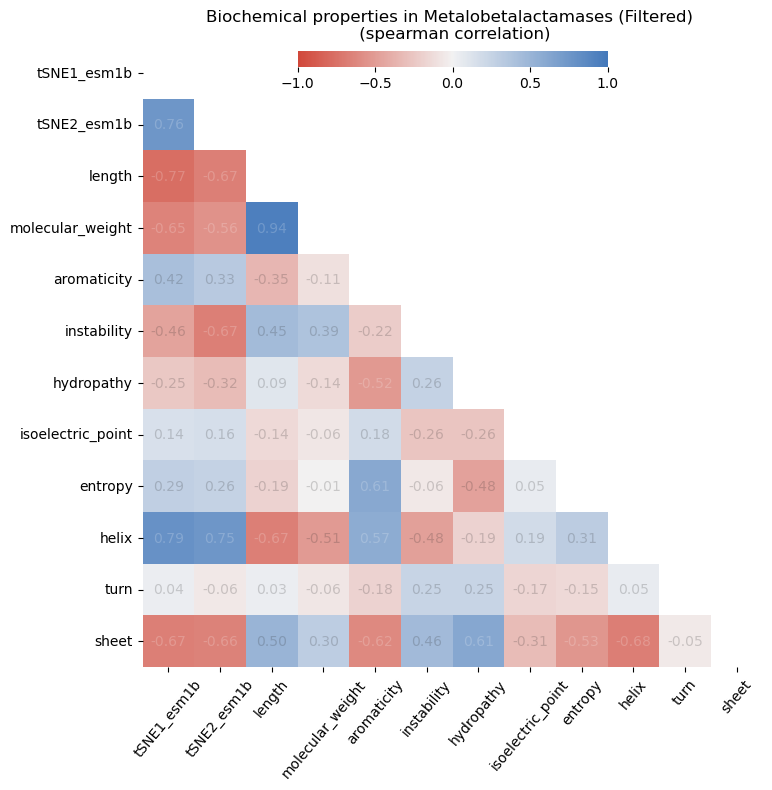

In [25]:
do_corr_mat("spearman", df_mbl_filtered, "Biochemical properties in Metalobetalactamases (Filtered) \n")

## sbl filter

In [26]:
# load seqs annots
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

# load tsne coords and merge annots
df_sbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_sbl_esm1b.csv")
df_sbl = df_sbl.merge(df_annot, on = "seq_id")
df_sbl.rename(columns = {"gravy":"hydropathy"}, inplace = True)

In [27]:
df_a = df_sbl[df_sbl.bla_class == "Class A"]
print(f"{len(df_a)}")

df_a_filtered = df_a[df_a['length'].between(209.3, 388.7)]
print(f"{len(df_a_filtered)}")

13314
13203


In [28]:
df_a_high_len = df_a[~df_a.seq_id.isin(df_a_filtered.seq_id.to_list())]
# df_a_high_len[["protein_name", "seq"]].to_csv("/home/gama/desktop/classA_no_in_median_range.csv", index = False)
print(f"{len(df_a_high_len)}")

111


In [29]:
df_a_high_len.protein_name.nunique()

111

In [30]:
df_c = df_sbl[df_sbl.bla_class == "Class C"]
print(f"{len(df_c)}")

df_c_filtered = df_c[df_c['length'].between(266.7, 495.3)]
print(f"{len(df_c_filtered)}")

6586
6571


In [31]:
df_c_high_len = df_c[~df_c.seq_id.isin(df_c_filtered.seq_id.to_list())]
# df_c_high_len[["protein_name", "seq"]].to_csv("/home/gama/desktop/classC_no_in_median_range.csv", index = False)
print(f"{len(df_c_high_len)}")

15


In [32]:
df_d = df_sbl[df_sbl.bla_class == "Class D"]
print(f"{len(df_d)}")

df_d_filtered = df_d[df_d['length'].between(190.4, 353.6)]
print(f"{len(df_d_filtered)}")

2779
2762


In [33]:
df_d_high_len = df_d[~df_d.seq_id.isin(df_d_filtered.seq_id.to_list())]
# df_d_high_len[["protein_name", "seq"]].to_csv("/home/gama/desktop/classD_no_in_median_range.csv", index = False)
print(f"{len(df_d_high_len)}")

17


In [34]:
df_sbl_filterLen = pd.concat([df_a_filtered, df_c_filtered,df_d_filtered])
print(f"{len(df_sbl_filterLen)}")

22536


In [35]:
properties = ["tSNE1_esm1b", "tSNE2_esm1b", 'length','molecular_weight', 'aromaticity', 'instability', 
              'hydropathy', 'isoelectric_point','entropy','helix', 'turn', 'sheet', 
              "bla_subclass", "protein_name", "protein_family_header", "#name",
             'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species'] 

In [36]:
# MBL has 10 data points with nans using entropy as col
df_sbl_filterLen_nonan = df_sbl_filterLen[properties].dropna(subset=['entropy'])
print(f"{len(df_sbl_filterLen_nonan)}")
df_sbl_filterLen_nonan

22500


,tSNE1_esm1b,tSNE2_esm1b,length,molecular_weight,aromaticity,instability,hydropathy,isoelectric_point,entropy,helix,...,bla_subclass,protein_name,protein_family_header,#name,Phylum,Class,Order,Family,Genus,Species
3,-0.283795,-13.681005,284,32041.5642,0.080986,33.895775,-0.316901,8.350993,4.124073,0.295775,...,Class A,ACI-1,ACI,gi|5596421|emb|CAB51471.1|ACI-1| class A exten...,NaN,NaN,NaN,NaN,NaN,NaN
4,-0.266154,-13.693493,284,32045.5974,0.084507,33.596831,-0.302465,8.549555,4.127280,0.299296,...,Class A,ACI-2,ACI,AHN92697.1|ACI-2| beta-lactamase [uncultured b...,NaN,NaN,NaN,NaN,NaN,NaN
5,-0.262226,-13.693281,284,32001.5169,0.080986,32.084859,-0.301408,8.395089,4.105261,0.299296,...,Class A,ACI-3,ACI,EHO64028.1|ACI-3| hypothetical protein HMPREF9...,NaN,NaN,NaN,NaN,NaN,NaN
6,-0.344596,-13.637093,284,31983.5281,0.080986,33.217606,-0.305986,8.549555,4.127280,0.295775,...,Class A,ACI-4,ACI,AHN92696.1|ACI-4| beta-lactamase [uncultured b...,NaN,NaN,NaN,NaN,NaN,NaN
7,-0.291932,-13.676996,284,32067.5981,0.084507,33.061972,-0.310211,8.344933,4.115166,0.299296,...,Class A,ACI-5,ACI,AMP55835.1|ACI-5| classA [uncultured bacterium],NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22677,7.422735,48.266964,217,24962.1621,0.110599,30.710599,-0.446083,6.347290,4.127949,0.308756,...,Class D,PAE-P1,Other,GIP03469.1|PAE-P1| putative beta-lactamase Ybx...,p__Firmicutes,c__Bacilli,o__Paenibacillales,NaN,NaN,NaN
22678,3.675053,52.575490,271,31629.8315,0.132841,36.210738,-0.377491,5.887860,4.202824,0.339483,...,Class D,RSD1-1,RSD1,AUW34360.1|RSD1-1| RSD1 family class D beta-la...,p__Bacteroidota,c__Bacteroidia,o__Bacteroidales,f__Prolixibacteraceae,g__UBA6024,NaN
22679,4.300918,52.826134,257,28995.0452,0.105058,38.777043,-0.246693,6.768410,4.120463,0.330739,...,Class D,RSD2-1,RSD2,AUW34362.1|RSD2-1| class D beta-lactamase RSD2-1,p__Campylobacterota,c__Campylobacteria,o__Campylobacterales,f__Sulfurimonadaceae,g__Sulfuricurvum,s__Sulfuricurvum sp002327465
22680,4.274964,52.835730,252,28425.4820,0.099206,37.583730,-0.182143,6.852702,4.123087,0.337302,...,Class D,RSD2-2,RSD2,AUW34361.1|RSD2-2| class D beta-lactamase RSD2-2,p__Campylobacterota,c__Campylobacteria,o__Campylobacterales,f__Sulfurimonadaceae,g__Sulfuricurvum,s__Sulfuricurvum sp002327465


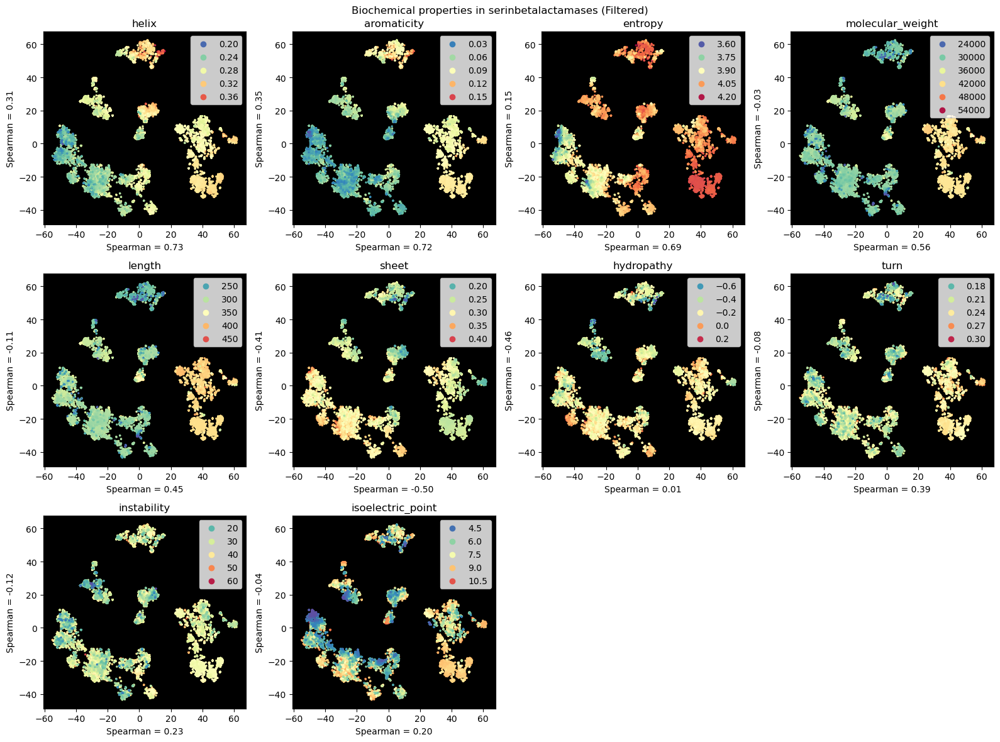

In [37]:
properties2 = [
    # spearman > 0.7
    'helix', 'aromaticity', 
    # spearman > 0.5
    'entropy','molecular_weight','length','sheet', 
    # spearman > 0.3
    'hydropathy', 'turn', 
     # spearman < 0.3
    'instability',  'isoelectric_point'
]


def do_scatter_panel(df, title):


    # set figure composition
    plt.figure(figsize=(16,12)) # 25,10
    
    # iterate over each panel
    for idx, prop in enumerate(properties2):
           
        # set palette
        palette = "Spectral_r"
        


        # data = 
        data = df[prop].values

        # compute corrs
        spearman_x = spearmanr(df.tSNE1_esm1b.values, data)[0]
        spearman_y = spearmanr(df.tSNE2_esm1b.values, data)[0]

        # plot
        ax = plt.subplot(3, 4, idx+1)
        ax.set_facecolor('black')
        sns.scatterplot(
            data = df.sort_values(prop, ascending=False), x = "tSNE1_esm1b", y = "tSNE2_esm1b", alpha = 1, s = 5,
             hue = prop, palette = palette, edgecolor = None, ax = ax)
        plt.title(prop)
        plt.xlabel(f"Spearman = {spearman_x:.2f}")
        plt.ylabel(f"Spearman = {spearman_y:.2f}")
        plt.legend(frameon=True)

        
    plt.suptitle(title)
    plt.tight_layout()
    

do_scatter_panel(df_sbl_filterLen_nonan, "Biochemical properties in serinbetalactamases (Filtered)")

In [38]:
properties2 = [
    # spearman > 0.7
    'helix', 'aromaticity', 
    # spearman > 0.5
    'entropy','molecular_weight','length','sheet', 
    # spearman > 0.3
    'hydropathy', 'turn', 
     # spearman < 0.3
    'instability',  'isoelectric_point'
] 

def do_scatter_panel(df, title):


    # set figure composition
    plt.figure(figsize=(16,9)) # 25,10
    
    # iterate over each panel
    for idx, prop in enumerate(properties2):
           
        # set palette
        palette = "Spectral_r"
        
        # create continuous colorbar normalized
        norm = plt.Normalize(df[prop].min(), df[prop].max())
        sm = plt.cm.ScalarMappable(cmap = palette, norm = norm)
        sm.set_array([])

        # data = 
        data = df[prop].values

        # compute corrs
        spearman_x = spearmanr(df.tSNE1_esm1b.values, data)[0]
        spearman_y = spearmanr(df.tSNE2_esm1b.values, data)[0]

        # plot
        ax = plt.subplot(3, 4, idx+1)
        sns.scatterplot(
            data = df.sort_values(prop, ascending=False), x = "tSNE1_esm1b", y = "tSNE2_esm1b", alpha = 1, s = 1,
            style = "bla_subclass", hue = prop, palette = palette, edgecolor = "black", ax = ax)
        plt.title(prop)
        plt.xlabel(f"Spearman = {spearman_x:.2f}")
        plt.ylabel(f"Spearman = {spearman_y:.2f}")

        # remove dafault legend and add colorbar
        ax.get_legend().remove()
        ax.figure.colorbar(sm)
        plt.tight_layout()
        
    plt.suptitle(title)
    plt.tight_layout()
    

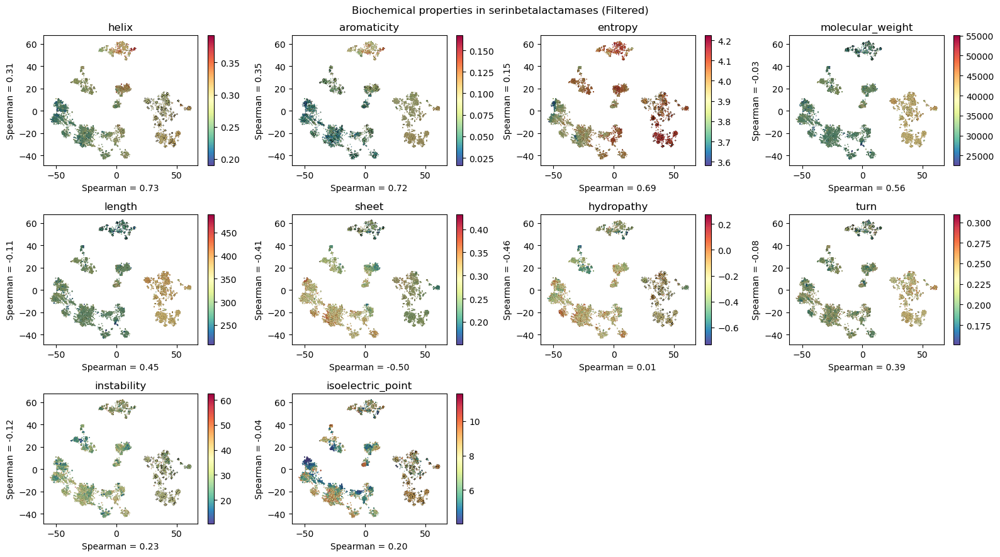

In [39]:
do_scatter_panel(df_sbl_filterLen_nonan, "Biochemical properties in serinbetalactamases (Filtered)")

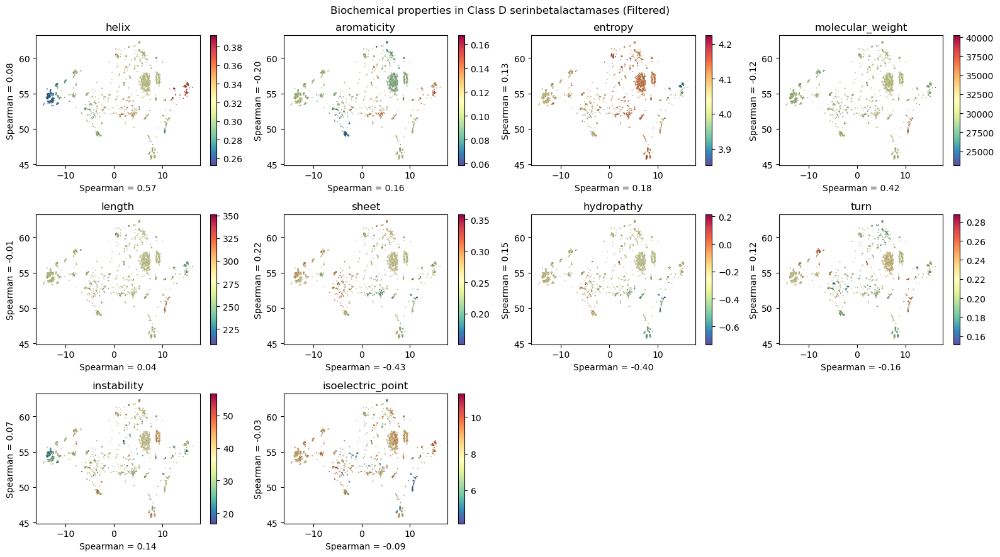

In [40]:
df_sbl_filterLen_nonan_d = df_sbl_filterLen_nonan[df_sbl_filterLen_nonan.bla_subclass == "Class D"]

do_scatter_panel(
    df_sbl_filterLen_nonan_d[df_sbl_filterLen_nonan_d.tSNE1_esm1b.between(-20,30)],
    "Biochemical properties in Class D serinbetalactamases (Filtered)")

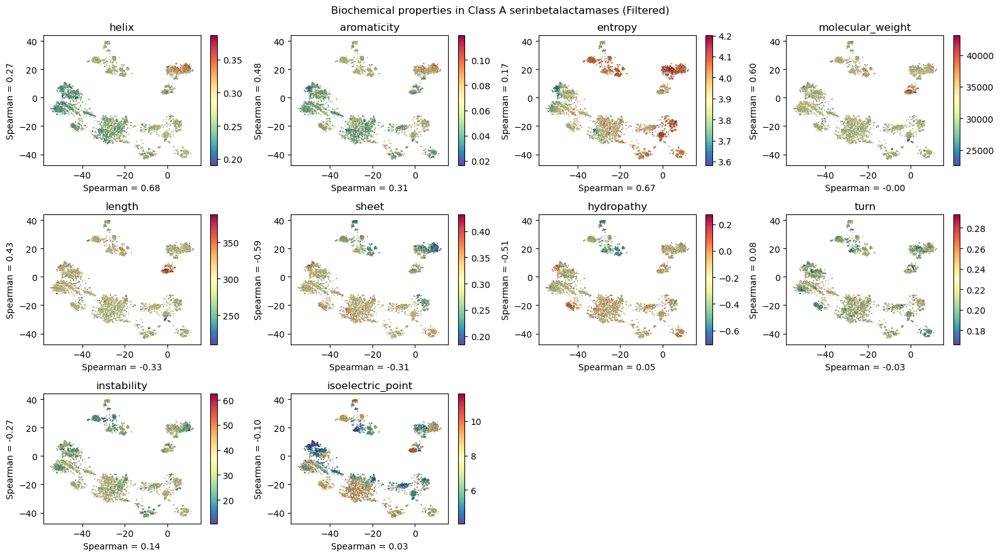

In [41]:
df_sbl_filterLen_nonan_a = df_sbl_filterLen_nonan[df_sbl_filterLen_nonan.bla_subclass == "Class A"]

do_scatter_panel(df_sbl_filterLen_nonan_a, "Biochemical properties in Class A serinbetalactamases (Filtered)")

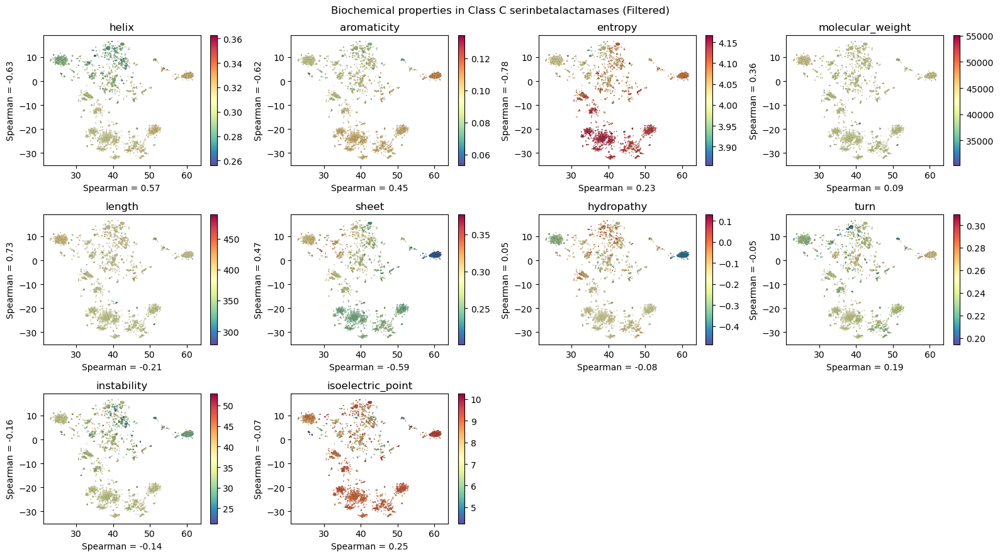

In [42]:
df_sbl_filterLen_nonan_c = df_sbl_filterLen_nonan[df_sbl_filterLen_nonan.bla_subclass == "Class C"]

do_scatter_panel(df_sbl_filterLen_nonan_c, "Biochemical properties in Class C serinbetalactamases (Filtered)")

In [43]:
def do_corr_mat(method, df, title):
    
    """
    Compute a corr matrix given a method (pearson/spearman), df and title
    """
    
    # compute corr, mask and palette
    corr_r = df.corr(method = method)
    mask_r = np.triu(np.ones_like(corr_r, dtype=bool)) 
    custom_cmap = sns.diverging_palette(15, 250, as_cmap=True) # custom diverging cmap
    
    # plot
    plt.figure(figsize=(8,8))
    sns.heatmap(
        corr_r, mask = mask_r, cmap = custom_cmap, vmax = 1, vmin = -1, annot=True, fmt = ".2f",
        square=True, linewidths=0, center = 0,
        annot_kws = {"fontsize": 10, "alpha": 0.2},
        cbar_kws = {"shrink": 0.5, "location": "bottom", "pad": -1})
    plt.title(f"{title} ({method} correlation)")
    plt.ylabel("")
    plt.xlabel("")
    plt.xticks(rotation = 50)

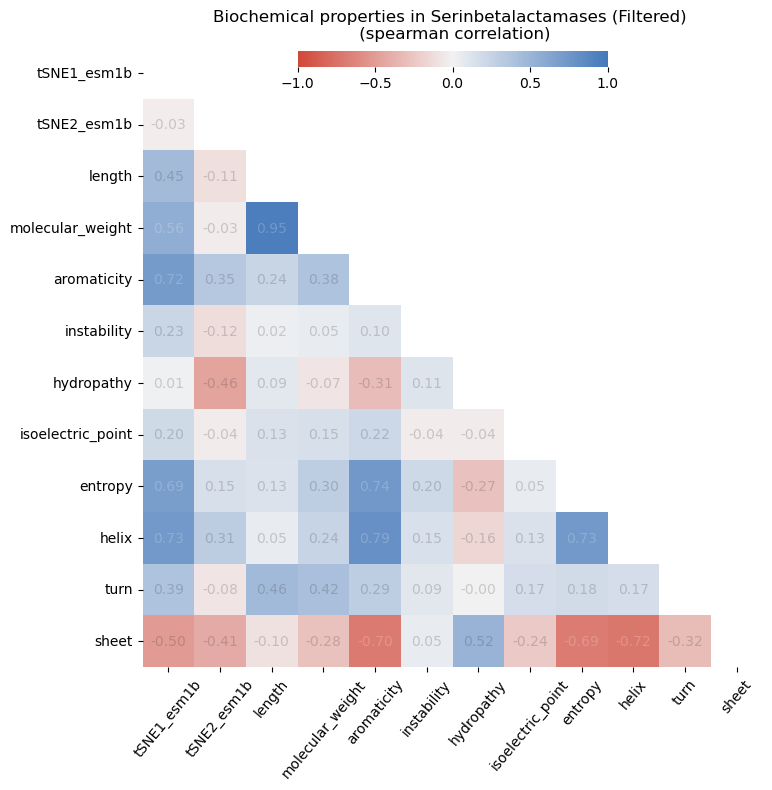

In [44]:
do_corr_mat("spearman", df_sbl_filterLen_nonan, "Biochemical properties in Serinbetalactamases (Filtered) \n")

In [45]:
data_sbl = df_sbl_filterLen_nonan.select_dtypes(["number"])
spearman_correlation_matrix, p_values = spearmanr(data_sbl)

Text(0.5, 1.0, 'Spearman corr')

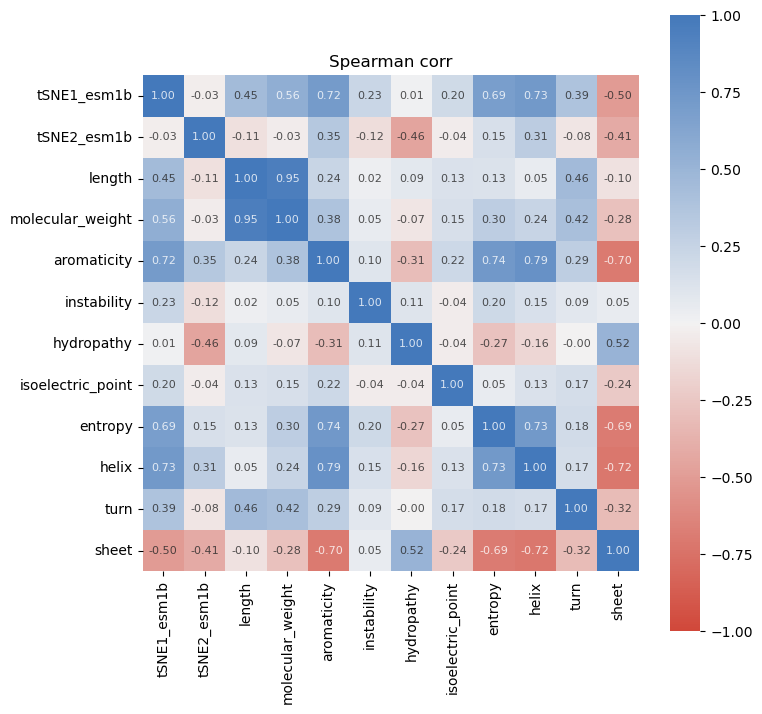

In [46]:
custom_cmap = sns.diverging_palette(15, 250, as_cmap=True)

plt.figure(figsize=(8,8))
sns.heatmap(
        spearman_correlation_matrix, cmap = custom_cmap, vmax = 1, vmin = -1, annot=True, fmt = ".2f",
        square=True, linewidths=0, center = 0,
        annot_kws = {"fontsize": 8, "alpha": 0.8},
    xticklabels=data_sbl.columns, yticklabels=data_sbl.columns
        ).set_title("Spearman corr")

Text(0.5, 1.0, '(log norm) p-values of Spearman corr')

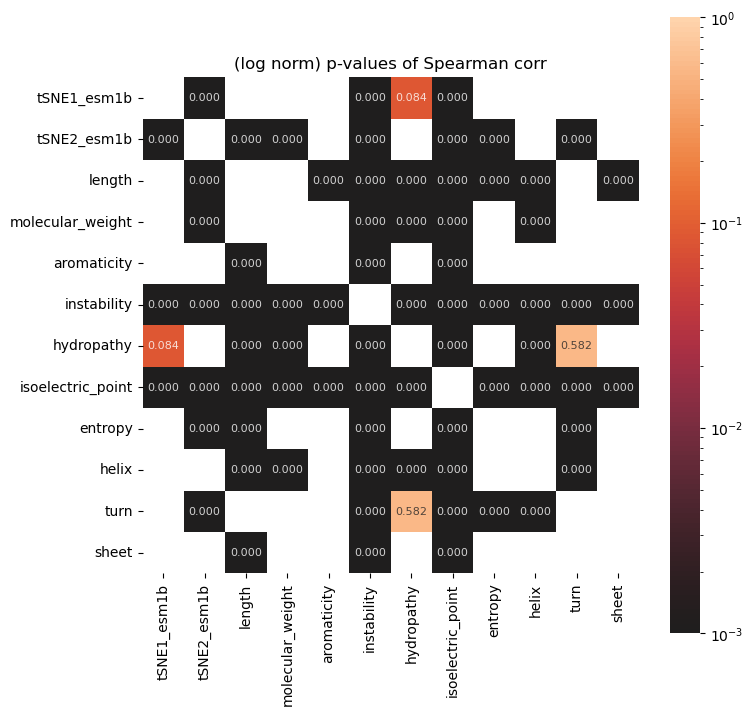

In [47]:
from matplotlib.colors import LogNorm

plt.figure(figsize=(8,8))
sns.heatmap(
        p_values, annot=True, fmt = ".3f", norm=LogNorm(vmin=0.001, vmax=1),
        square=True, linewidths=0, center = 0,
        annot_kws = {"fontsize": 8, "alpha": 0.8},
    xticklabels=data_sbl.columns, yticklabels=data_sbl.columns
        ).set_title("(log norm) p-values of Spearman corr")

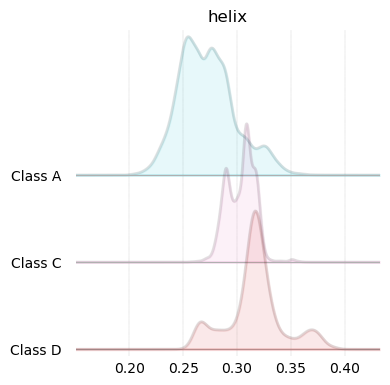

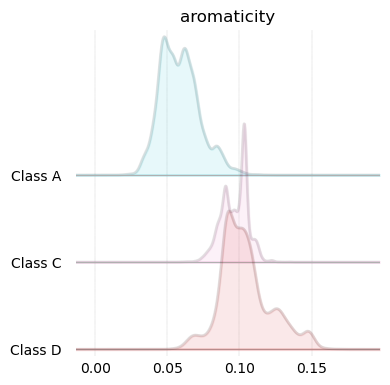

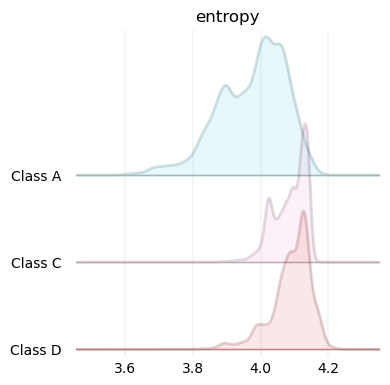

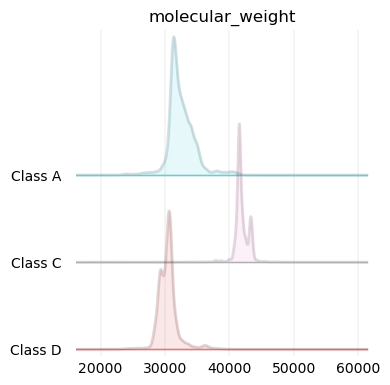

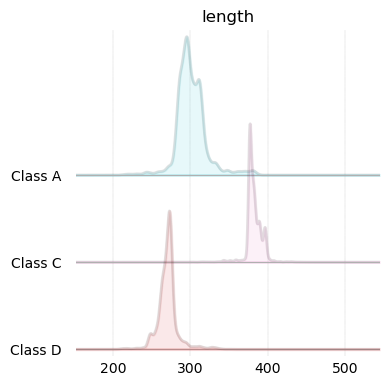

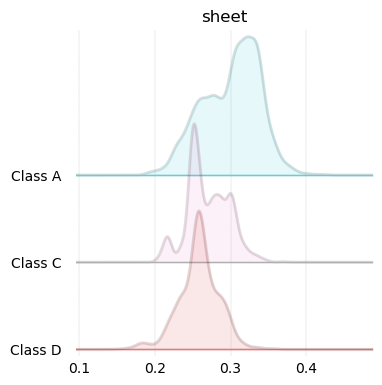

In [48]:
df_sbl_nocons = df_sbl_filterLen_nonan[~df_sbl_filterLen_nonan.bla_subclass.str.contains("Consensus")]

# seq_length by bla_class


for ele in ["helix","aromaticity", "entropy", "molecular_weight", "length", "sheet"]:
    fig, axes = joypy.joyplot(
        df_sbl_nocons[[ele, "bla_subclass"]], by="bla_subclass", ylim='own', 
        overlap=1, range_style='all', grid=True, linewidth=2, legend=False, figsize=(4,4),
        alpha=0.1, linecolor="black", background='white',fill=True,
        kind="kde", title = ele,colormap = cm.tab10_r) 
    plt.grid(color = 'grey', linestyle = '--', linewidth = 0.15)

In [49]:
def do_iscatter2(df, annot):
    fig = px.scatter(
        df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
        height = 600, width = 700, color = annot,
        hover_name = "protein_name", 
        color_continuous_scale = px.colors.sequential.Turbo,
        hover_data = ["length","protein_family_header", '#name', "protein_name",
                      'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species'])
    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()

do_iscatter2(df_sbl_nocons[df_sbl_nocons.bla_subclass == "Class A"], "entropy")

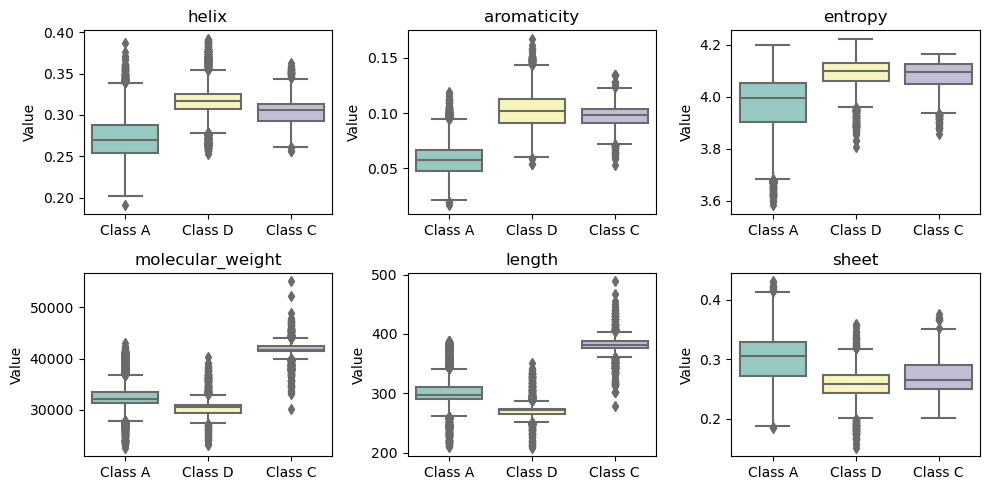

In [50]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(10, 5))

for i, ele in enumerate(["helix","aromaticity", "entropy", "molecular_weight", "length", "sheet"]):
    
    x = "bla_subclass"
    y = ele
    order = ['Class A', 'Class D', 'Class C']
    
    row = i // 3
    col = i % 3
    
    ax = axs[row, col]
    sns.boxplot(data=df_sbl_nocons, x=x, y=y, order=order, ax=ax, palette="Set3")
    ax.set_title(ele)
    ax.set_xlabel("")
    ax.set_ylabel("Value")
    
fig.tight_layout()

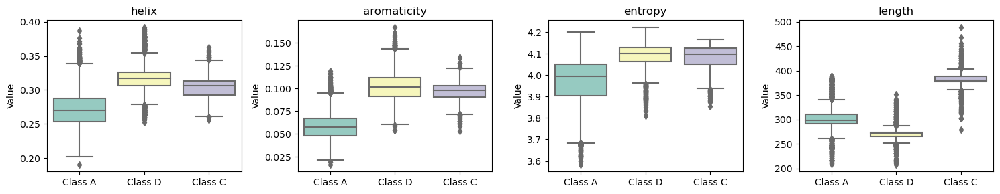

In [51]:
fig, axs = plt.subplots(ncols=4, figsize=(15, 3))

for i, ele in enumerate(["helix","aromaticity", "entropy","length"]):
    
    x = "bla_subclass"
    y = ele
    order = ['Class A', 'Class D', 'Class C']
    
    ax = axs[i]
    sns.boxplot(data=df_sbl_nocons, x=x, y=y, order=order, ax=ax, palette="Set3")
    ax.set_title(ele)
    ax.set_xlabel("")
    ax.set_ylabel("Value")
    
    
fig.tight_layout()


############### helix ###############

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Class A vs. Class D: Kruskal-Wallis independent samples (pairwise between groups), P_val:0.000e+00 Stat=3.869e+03
Class D vs. Class C: Kruskal-Wallis independent samples (pairwise between groups), P_val:3.010e-221 Stat=1.008e+03
Class A vs. Class C: Kruskal-Wallis independent samples (pairwise between groups), P_val:0.000e+00 Stat=6.620e+03

############### aromaticity ###############

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Class A vs. Class D: Kruskal-Wallis independent samples (pairwise between groups), P_val:0.000e+00 Stat=6.330e+03
Class D vs. Class C: Kruskal-Wallis independent samples (pairwise between groups), P_val:1.266e

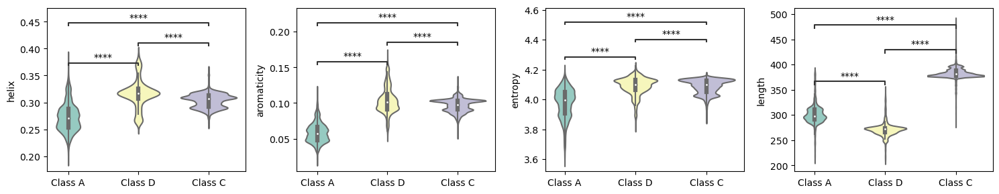

In [52]:
fig, axs = plt.subplots(ncols=4, figsize=(15, 3))

for i, ele in enumerate(["helix", "aromaticity", "entropy", "length"]):
    
    print(f"\n############### {ele} ###############\n")
    x = "bla_subclass"
    y = ele
    order = ['Class A', 'Class D', 'Class C']
    
    ax = axs[i]
    sns.violinplot(data=df_sbl_nocons, x=x, y=y, order=order, ax=ax, palette="Set3")
    
    annot = Annotator(ax, [
        ('Class A', 'Class D'), 
        ('Class A', 'Class C'),
        ('Class D', 'Class C')], 
        data=df_sbl_nocons, x=x, y=y, order=order)
    
    annot.configure(test='Kruskal', text_format='star', loc='inside', verbose=2)
    annot.apply_test()
    ax, test_results = annot.annotate()
    
    ax.set_xlabel("")
    
fig.tight_layout()

In [53]:
df_sbl_filterLen_nonan.groupby(['bla_subclass'])['length'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
bla_subclass,,,,,,,,
Class A,13177.0,301.42,19.64,210.0,291.0,298.0,311.0,388.0
Class C,6564.0,382.44,10.52,279.0,377.0,381.0,388.0,489.0
Class D,2759.0,270.91,13.52,208.0,265.0,272.0,274.0,351.0


In [54]:
# df_sbl_nocons[["helix", "aromaticity", "entropy", "length", "bla_subclass"]].to_csv("/home/gama/datos.csv")

Fin